## Imports

In [2]:
import pandas as pd
from datetime import datetime
from datetime import timedelta
from tqdm import tqdm
import plotly.graph_objects as go
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import time
import urllib.request
from IPython.display import clear_output
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from math import sqrt

CRYPTOAPI_URL = 'https://min-api.cryptocompare.com/data/pricemulti?fsyms=BTC&tsyms=USD&api_key=f311d68ba556b86506598d21aba8bcb0833a7c0431c859463e75ff8a934d0f6c'


## Dataset Reading - Merging - Creating

We read the non botted tweets preprocessed dataset 

In [3]:
tweets = pd.read_csv(r'C:\Users\Fivos\Desktop\Πτυχιακή\Data Collection\twitter\Results tweets\tweets_not_botted_preprocessed_final_floored.csv', low_memory = False)

We remove the unnamed column from the dataset

In [4]:
tweets = tweets.loc[:, ~tweets.columns.str.contains('^Unnamed')]
tweets

,UserName,CreatedAt,ID,Text,UserFollowerCount,RetweetCount,Likes,compound,score,FlooredDatatime
0,Newborn99,Sat Mar 20 10:51:56 +0000 2021,1.373226e+18,: The DEX is set to launch on the network wit...,215.0,3190.0,0.0,0.0000,0.0000,2021-03-20 11:00:00
1,Shahriar,Sat Mar 20 10:51:56 +0000 2021,1.373226e+18,🚀 is the only blockchain that can communicate ...,18.0,0.0,1.0,-0.3089,-11.1204,2021-03-20 11:00:00
2,Common sense...,Sat Mar 20 10:51:57 +0000 2021,1.373226e+18,"People, hear me... Cheap blockchain stock is t...",24.0,0.0,0.0,0.1779,4.2696,2021-03-20 11:00:00
3,SimplyVickson💞💕💖,Sat Mar 20 10:51:58 +0000 2021,1.373226e+18,: I'll send in #ETH or #BTC to one person wh...,140.0,1044.0,0.0,0.0000,0.0000,2021-03-20 11:00:00
4,Febrio Pujiana,Sat Mar 20 10:51:58 +0000 2021,1.373226e+18,: We added information to the website URL ava...,154.0,553.0,0.0,0.0000,0.0000,2021-03-20 11:00:00
...,...,...,...,...,...,...,...,...,...,...
5685367,Block Watcher,Tue Apr 20 14:55:24 +0000 2021,1.384521e+18,"Tue Apr :: (:)USD : ,.: ,: ,: 1,. : 3,: , (....",909.0,0.0,0.0,0.0000,0.0000,2021-04-20 15:00:00
5685368,cjglory,Tue Apr 20 14:55:24 +0000 2021,1.384521e+18,: on Venmo for million users places more pr...,525.0,1141.0,0.0,-0.3597,-215658.1350,2021-04-20 15:00:00
5685369,Crypto Bible,Tue Apr 20 14:55:25 +0000 2021,1.384521e+18,Bitcoin keeps getting rejected from many trend...,36798.0,0.0,0.0,-0.9226,-33949.8348,2021-04-20 15:00:00
5685370,sellvolbuytesla,Tue Apr 20 14:55:25 +0000 2021,1.384521e+18,* DIGITAL ASSET MGMT TO LIST BITCOIN FUND ON N...,603.0,0.0,0.0,0.3612,217.8036,2021-04-20 15:00:00


We split the dataset into 4 parts and process each part individually to save some time

In [5]:
week1_tweets = tweets[:1800000]
week1_tweets

,UserName,CreatedAt,ID,Text,UserFollowerCount,RetweetCount,Likes,compound,score,FlooredDatatime
0,Newborn99,Sat Mar 20 10:51:56 +0000 2021,1.373226e+18,: The DEX is set to launch on the network wit...,215.0,3190.0,0.0,0.0000,0.0000,2021-03-20 11:00:00
1,Shahriar,Sat Mar 20 10:51:56 +0000 2021,1.373226e+18,🚀 is the only blockchain that can communicate ...,18.0,0.0,1.0,-0.3089,-11.1204,2021-03-20 11:00:00
2,Common sense...,Sat Mar 20 10:51:57 +0000 2021,1.373226e+18,"People, hear me... Cheap blockchain stock is t...",24.0,0.0,0.0,0.1779,4.2696,2021-03-20 11:00:00
3,SimplyVickson💞💕💖,Sat Mar 20 10:51:58 +0000 2021,1.373226e+18,: I'll send in #ETH or #BTC to one person wh...,140.0,1044.0,0.0,0.0000,0.0000,2021-03-20 11:00:00
4,Febrio Pujiana,Sat Mar 20 10:51:58 +0000 2021,1.373226e+18,: We added information to the website URL ava...,154.0,553.0,0.0,0.0000,0.0000,2021-03-20 11:00:00
...,...,...,...,...,...,...,...,...,...,...
1799995,BHIMN🐥TION. #WEMOVE,Mon Mar 29 09:34:01 +0000 2021,1.376468e+18,: Authentic plain T-shirts @ cool 15ghc each ...,1209.0,34.0,0.0,0.5859,24792.3585,2021-03-29 10:00:00
1799996,Andy (ZB) 🏴󠁧󠁢󠁳󠁣󠁴󠁿,Mon Mar 29 09:34:01 +0000 2021,1.376468e+18,Pretty big #crypto news. Think we are still ve...,367.0,0.0,3.0,0.4939,725.0452,2021-03-29 10:00:00
1799997,Financial News,Mon Mar 29 09:34:02 +0000 2021,1.376468e+18,Bitcoin and other cryptocurrencies could face ...,56962.0,0.0,0.0,0.3612,20574.6744,2021-03-29 10:00:00
1799998,Joseph Higgins,Mon Mar 29 09:34:02 +0000 2021,1.376468e+18,: Someone just sent of #Bitcoin with just a ...,128.0,403.0,0.0,0.0000,0.0000,2021-03-29 10:00:00


We round the CreatedAt field to intervals of one minute

In [6]:
#we make one minute FlooredDatatime Intervals

def roundTime(dt=None, roundTo=60):
   """Round a datetime object to any time lapse in seconds
   dt : datetime.datetime object, default now.
   roundTo : Closest number of seconds to round to, default 1 minute.
   Author: Thierry Husson 2012 - Use it as you want but don't blame me.
   """
   if dt == None : dt = datetime.datetime.now()
   seconds = (dt.replace(tzinfo=None) - dt.min).seconds
   rounding = (seconds+roundTo/2) // roundTo * roundTo
   return dt + timedelta(0,rounding-seconds,-dt.microsecond)

In [7]:
week1_tweets['MinutesFlooredDatatime'] = 0
for i in tqdm(range(len(week1_tweets))):
    week1_tweets['MinutesFlooredDatatime'][i] = roundTime(datetime.strptime(week1_tweets['CreatedAt'][i],'%a %b %d %H:%M:%S +0000 %Y'))

<ipython-input-7-7bc632b9c358>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week1_tweets['MinutesFlooredDatatime'] = 0
  0%|                                                                                      | 0/1800000 [00:00<?, ?it/s]<ipython-input-7-7bc632b9c358>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week1_tweets['MinutesFlooredDatatime'][i] = roundTime(datetime.strptime(week1_tweets['CreatedAt'][i],'%a %b %d %H:%M:%S +0000 %Y'))
C:\Users\Fivos\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying 

In [8]:
week2_tweets = tweets[1800000:3600000]
week2_tweets

,UserName,CreatedAt,ID,Text,UserFollowerCount,RetweetCount,Likes,compound,score,FlooredDatatime
1800000,Hemant Navaliya🚩,Mon Mar 29 09:34:02 +0000 2021,1.376468e+18,: BREAKING NEWS moves to allow payment settle...,904.0,8.0,0.0,0.2263,1841.1768,2021-03-29 10:00:00
1800001,reality chaser⚡️⚡️,Mon Mar 29 09:34:03 +0000 2021,1.376468e+18,: Please Don’t scroll without Retweeting my h...,4688.0,244.0,0.0,0.3182,365471.7920,2021-03-29 10:00:00
1800002,beefy.finance,Mon Mar 29 09:34:03 +0000 2021,1.376468e+18,": New Vault announcement! Stake , earn ! Simp...",91.0,58.0,0.0,0.6341,3404.4829,2021-03-29 10:00:00
1800003,Olakunle Hughes,Mon Mar 29 09:34:03 +0000 2021,1.376468e+18,: Please Don’t scroll without Retweeting my h...,7080.0,244.0,0.0,0.3182,551949.7200,2021-03-29 10:00:00
1800004,Oceanmighty7775 #BRG,Mon Mar 29 09:34:04 +0000 2021,1.376468e+18,: Visa launches test program to allow payment...,120.0,315.0,0.0,0.2263,8581.2960,2021-03-29 10:00:00
...,...,...,...,...,...,...,...,...,...,...
3599995,Christopher Koumi 🏴󠁧󠁢󠁥󠁮󠁧󠁿🇬🇧🇬🇷🇨🇾🇸🇯,Thu Apr 08 16:35:24 +0000 2021,1.380198e+18,: Is starting a weekend early?😉 🚀⚡️📱🌍 …,469.0,18.0,0.0,0.0000,0.0000,2021-04-08 17:00:00
3599996,K,Thu Apr 08 16:35:25 +0000 2021,1.380198e+18,: Making crypto run on % renewables is a big ...,5.0,637.0,0.0,0.7227,2305.4130,2021-04-08 17:00:00
3599997,BTC Sessions 😎,Thu Apr 08 16:35:25 +0000 2021,1.380198e+18,: You’re disgustingly rich off . Where do yo...,7331.0,1.0,0.0,-0.0772,-1131.9064,2021-04-08 17:00:00
3599998,Brandon,Thu Apr 08 16:35:26 +0000 2021,1.380198e+18,": Bitcoin is an open, decentralized protocol ...",112.0,302.0,0.0,0.3182,10798.4352,2021-04-08 17:00:00


In [9]:
#week1_tweets.to_csv(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\week1_tweets.csv')

In [10]:
week2_tweets['MinutesFlooredDatatime'] = 0
for i in tqdm(range(1800000,3600000)):
    week2_tweets['MinutesFlooredDatatime'][i] = roundTime(datetime.strptime(week2_tweets['CreatedAt'][i],'%a %b %d %H:%M:%S +0000 %Y'))

<ipython-input-10-a39613fc4954>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week2_tweets['MinutesFlooredDatatime'] = 0
  0%|                                                                                      | 0/1800000 [00:00<?, ?it/s]<ipython-input-10-a39613fc4954>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week2_tweets['MinutesFlooredDatatime'][i] = roundTime(datetime.strptime(week2_tweets['CreatedAt'][i],'%a %b %d %H:%M:%S +0000 %Y'))
C:\Users\Fivos\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is tryin

In [11]:
week3_tweets = tweets[3600000:]

In [12]:
week3_tweets['MinutesFlooredDatatime'] = 0
for i in tqdm(range(3600000,len(tweets))):
    week3_tweets['MinutesFlooredDatatime'][i] = roundTime(datetime.strptime(week3_tweets['CreatedAt'][i],'%a %b %d %H:%M:%S +0000 %Y'))

<ipython-input-12-5c5a9839ffca>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week3_tweets['MinutesFlooredDatatime'] = 0
  0%|                                                                                      | 0/2085372 [00:00<?, ?it/s]<ipython-input-12-5c5a9839ffca>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week3_tweets['MinutesFlooredDatatime'][i] = roundTime(datetime.strptime(week3_tweets['CreatedAt'][i],'%a %b %d %H:%M:%S +0000 %Y'))
C:\Users\Fivos\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is tryin

In [13]:
all_weeks = [week1_tweets,week2_tweets,week3_tweets]
minute_tweets = pd.concat(all_weeks)

In [14]:
minute_tweets

,UserName,CreatedAt,ID,Text,UserFollowerCount,RetweetCount,Likes,compound,score,FlooredDatatime,MinutesFlooredDatatime
0,Newborn99,Sat Mar 20 10:51:56 +0000 2021,1.373226e+18,: The DEX is set to launch on the network wit...,215.0,3190.0,0.0,0.0000,0.0000,2021-03-20 11:00:00,2021-03-20 10:52:00
1,Shahriar,Sat Mar 20 10:51:56 +0000 2021,1.373226e+18,🚀 is the only blockchain that can communicate ...,18.0,0.0,1.0,-0.3089,-11.1204,2021-03-20 11:00:00,2021-03-20 10:52:00
2,Common sense...,Sat Mar 20 10:51:57 +0000 2021,1.373226e+18,"People, hear me... Cheap blockchain stock is t...",24.0,0.0,0.0,0.1779,4.2696,2021-03-20 11:00:00,2021-03-20 10:52:00
3,SimplyVickson💞💕💖,Sat Mar 20 10:51:58 +0000 2021,1.373226e+18,: I'll send in #ETH or #BTC to one person wh...,140.0,1044.0,0.0,0.0000,0.0000,2021-03-20 11:00:00,2021-03-20 10:52:00
4,Febrio Pujiana,Sat Mar 20 10:51:58 +0000 2021,1.373226e+18,: We added information to the website URL ava...,154.0,553.0,0.0,0.0000,0.0000,2021-03-20 11:00:00,2021-03-20 10:52:00
...,...,...,...,...,...,...,...,...,...,...,...
5685367,Block Watcher,Tue Apr 20 14:55:24 +0000 2021,1.384521e+18,"Tue Apr :: (:)USD : ,.: ,: ,: 1,. : 3,: , (....",909.0,0.0,0.0,0.0000,0.0000,2021-04-20 15:00:00,2021-04-20 14:55:00
5685368,cjglory,Tue Apr 20 14:55:24 +0000 2021,1.384521e+18,: on Venmo for million users places more pr...,525.0,1141.0,0.0,-0.3597,-215658.1350,2021-04-20 15:00:00,2021-04-20 14:55:00
5685369,Crypto Bible,Tue Apr 20 14:55:25 +0000 2021,1.384521e+18,Bitcoin keeps getting rejected from many trend...,36798.0,0.0,0.0,-0.9226,-33949.8348,2021-04-20 15:00:00,2021-04-20 14:55:00
5685370,sellvolbuytesla,Tue Apr 20 14:55:25 +0000 2021,1.384521e+18,* DIGITAL ASSET MGMT TO LIST BITCOIN FUND ON N...,603.0,0.0,0.0,0.3612,217.8036,2021-04-20 15:00:00,2021-04-20 14:55:00


In [77]:
#minute_tweets.to_csv(r'C:\Users\Fivos\Desktop\Πτυχιακή\Data Collection\minute_tweets_non_botted.csv')

This is the price of Bitcoin (on the Kraken exchange platform) for every minute between the 20th of March and the 20th of April (source in the report)

In [20]:
price_per_min = pd.read_excel(r'C:\Users\Fivos\Desktop\Πτυχιακή\Data Collection\Historical Price Data\Minute- BTC_Price_20_March_until_20_April.xlsx',header= 0)

In [21]:
price_per_min

,Timestamp,Open,High,Low,Close,Volume (BTC),Volume (Currency),Weighted Price
0,2021-03-20 10:52:00,58695.7,58701,58695.7,58701,0.18,10830.2,58699.8
1,2021-03-20 10:53:00,58701,58763.3,58701,58763.3,0.32,18878,58729.8
2,2021-03-20 10:54:00,58763.3,58831.8,58763.3,58831.8,4.93,289618,58796.4
3,2021-03-20 10:55:00,58826.2,58831.7,58826.2,58829.6,0.03,1553.52,58830.4
4,2021-03-20 10:56:00,58810.3,58810.3,58805.9,58805.9,0.01,580.62,58807.3
...,...,...,...,...,...,...,...,...
44880,2021-04-20 14:52:00,55581.7,55648.8,55501.1,55634.3,25.56,1.42121e+06,55603.3
44881,2021-04-20 14:53:00,55633.4,55643.7,55523.2,55523.2,1.93,107282,55613.6
44882,2021-04-20 14:54:00,55519.6,55519.6,55445.2,55445.2,3.31,183787,55488.7
44883,2021-04-20 14:55:00,55455.5,55583,55455.5,55583,3.28,182073,55527.3


Click on the white rectangular box below the code to show the graph (leaving it open made the whole notebook go slower)

In [82]:
fig = go.Figure(data=[go.Candlestick(x=price_per_min['Timestamp'],
                open=price_per_min['Open'],
                high=price_per_min['High'],
                low=price_per_min['Low'],
                close=price_per_min['Close'])])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

We keep the Closing Price for our prediction

In [22]:
minutely_price = []
for i in range(len(price_per_min)):
    minutely_price.append(price_per_min['Close'][i])

In [23]:
len(minutely_price)

44885

The code below allows us to use the sum of the sentiment score of the tweets for every individual minute

In [24]:
minutely_sum = minute_tweets.groupby(['MinutesFlooredDatatime']).sum()['score']

NameError: name 'minute_tweets' is not defined

In [20]:
minutely_sum

MinutesFlooredDatatime
2021-03-20 10:52:00    1.074139e+07
2021-03-20 10:53:00    2.305862e+06
2021-03-20 10:54:00    4.481510e+06
2021-03-20 10:55:00    3.657477e+06
2021-03-20 10:56:00    6.172258e+06
                           ...     
2021-04-20 14:51:00    3.391379e+05
2021-04-20 14:52:00   -6.639301e+05
2021-04-20 14:53:00   -1.314924e+06
2021-04-20 14:54:00   -1.354999e+06
2021-04-20 14:55:00   -4.005834e+05
Name: score, Length: 42059, dtype: float64

In [21]:
index = minutely_sum.index

Some rows that exist in the price dataset do not exist in the tweet sentiment score per minute dataset. That is because for some certain minutes on certain dates, we have not gathered tweets. So the excess_rows set contains the difference between the two sets. 

In [ ]:
minutes_index = pd.to_datetime(minutely_sum.index)

In [22]:
excess_rows = (set(price_per_min['Timestamp']) - set(minutes_index))
len(excess_rows)

2826

In [23]:
excess_rows

{Timestamp('2021-04-17 05:35:00'),
 Timestamp('2021-04-17 10:36:00'),
 Timestamp('2021-04-10 10:20:00'),
 Timestamp('2021-04-11 09:35:00'),
 Timestamp('2021-04-17 02:50:00'),
 Timestamp('2021-04-17 12:01:00'),
 Timestamp('2021-04-17 05:05:00'),
 Timestamp('2021-04-11 18:06:00'),
 Timestamp('2021-04-10 13:55:00'),
 Timestamp('2021-04-17 04:09:00'),
 Timestamp('2021-04-11 00:46:00'),
 Timestamp('2021-04-10 22:50:00'),
 Timestamp('2021-04-17 10:21:00'),
 Timestamp('2021-04-11 16:37:00'),
 Timestamp('2021-04-17 11:53:00'),
 Timestamp('2021-04-17 11:17:00'),
 Timestamp('2021-04-10 21:21:00'),
 Timestamp('2021-04-11 12:26:00'),
 Timestamp('2021-04-17 11:12:00'),
 Timestamp('2021-04-11 02:53:00'),
 Timestamp('2021-04-17 08:07:00'),
 Timestamp('2021-04-10 16:04:00'),
 Timestamp('2021-04-17 07:30:00'),
 Timestamp('2021-04-11 04:48:00'),
 Timestamp('2021-04-17 09:15:00'),
 Timestamp('2021-03-20 13:32:00'),
 Timestamp('2021-04-11 09:05:00'),
 Timestamp('2021-04-10 18:55:00'),
 Timestamp('2021-04-

In [24]:
index_list = []
for i in range(len(price_per_min)):
    if price_per_min['Timestamp'][i] in excess_rows:
        index_list.append(i)        

We use it to make the two datasets have rows referring to exactly the same timestamps.

In [25]:
slided_minutely_price = [element for i, element in enumerate(minutely_price) if i not in index_list]

In [26]:
len(slided_minutely_price)

42059

There are some dashes present in the price dataset, we remove the rows from the tweets dataset corresponding to the same timestamps as the dashed rows.

In [27]:
dash_list = []
for i in range(len(slided_minutely_price)):
    if slided_minutely_price[i] == '—':
        dash_list.append(i)
dash_list

[2531,
 2541,
 2682,
 6480,
 6481,
 6482,
 6483,
 6484,
 6485,
 6486,
 9763,
 9916,
 9971,
 10703,
 11085,
 11245,
 11445,
 11540,
 11576,
 12587,
 14070,
 14252,
 15082,
 15131,
 15520,
 16560,
 16561,
 16562,
 16563,
 16564,
 16565,
 16566,
 16567,
 16568,
 16813,
 16822,
 16966,
 18335,
 18559,
 18576,
 18577,
 18581,
 18597,
 19685,
 19696,
 19833,
 19911,
 20068,
 20141,
 20152,
 20352,
 21222,
 21312,
 21472,
 21516,
 21517,
 21576,
 22040,
 22075,
 22212,
 22541,
 22995,
 23004,
 23011,
 23997,
 24065,
 24170,
 28395,
 28633,
 30572,
 32147,
 36013,
 36014,
 36015,
 36016,
 36017,
 36018,
 36019]

In [28]:
#removed dashed elements from price list
slided_minutely_price = [element for i, element in enumerate(slided_minutely_price) if i not in dash_list]

In [29]:
len(slided_minutely_price)

41981

In [30]:
#remove the elements corresponding to the dashed elements from score list
slided_minutely_sum = [element for i, element in enumerate(minutely_sum) if i not in dash_list]

In [31]:
len(slided_minutely_sum)

41981

We do the same for the index of dataset

In [32]:
slided_index = [element for i, element in enumerate(index) if i not in dash_list]

So the dataset is ready, we just need some preprocessing to be done before we start the training

In [33]:
df = pd.DataFrame({'Timestamp':slided_index,'Close Price':slided_minutely_price,'Sentiment Score':slided_minutely_sum })
df

,Timestamp,Close Price,Sentiment Score
0,2021-03-20 10:52:00,58701.0,1.074139e+07
1,2021-03-20 10:53:00,58763.3,2.305862e+06
2,2021-03-20 10:54:00,58831.8,4.481510e+06
3,2021-03-20 10:55:00,58829.6,3.657477e+06
4,2021-03-20 10:56:00,58805.9,6.172258e+06
...,...,...,...
41976,2021-04-20 14:51:00,55592.3,3.391379e+05
41977,2021-04-20 14:52:00,55634.3,-6.639301e+05
41978,2021-04-20 14:53:00,55523.2,-1.314924e+06
41979,2021-04-20 14:54:00,55445.2,-1.354999e+06


In [49]:
#df.to_csv(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\minutes_price_score_non_botted.csv')

## Dataset Preprocessing

We make a column containing the previous close price for every row and another one containing the moving average of the close price for every row (with a window of 100 preceding values)

In [35]:
price_list = []
price_list.append(None)
for i in range(1,len(df)):
    price_list.append(df['Close Price'][i-1])
price_list

[None,
 58701.0,
 58763.3,
 58831.8,
 58829.6,
 58805.9,
 58810.7,
 58717.1,
 58711.2,
 58747.7,
 58753.2,
 58752.3,
 58760.9,
 58761.0,
 58755.2,
 58755.3,
 58750.0,
 58692.3,
 58661.6,
 58717.0,
 58733.7,
 58698.8,
 58665.8,
 58688.1,
 58772.3,
 58756.9,
 58757.0,
 58766.6,
 58714.4,
 58713.6,
 58713.6,
 58739.3,
 58746.2,
 58761.8,
 58862.6,
 58863.5,
 58816.4,
 58816.6,
 58849.0,
 58851.1,
 58797.3,
 58811.2,
 58797.9,
 58797.9,
 58790.1,
 58797.9,
 58790.0,
 58797.9,
 58797.8,
 58855.9,
 58847.8,
 59099.0,
 59055.8,
 59073.1,
 59188.7,
 59247.0,
 59231.1,
 59289.3,
 59254.2,
 59271.1,
 59244.3,
 59189.7,
 59189.3,
 59108.9,
 59166.0,
 59199.4,
 59199.1,
 59199.9,
 59240.9,
 59220.6,
 59185.8,
 59171.2,
 59206.8,
 59162.1,
 59151.0,
 59151.0,
 59096.1,
 59105.9,
 59109.4,
 59132.3,
 59135.1,
 59129.9,
 59134.6,
 59130.0,
 59130.0,
 59130.0,
 59100.0,
 59087.8,
 59050.1,
 59042.8,
 59011.5,
 59017.8,
 59005.1,
 59005.1,
 59001.5,
 58940.1,
 58850.1,
 58841.5,
 58884.0,
 58849.9,
 58

In [36]:
df['Previous Close Price'] = price_list
df

,Timestamp,Close Price,Sentiment Score,Previous Close Price
0,2021-03-20 10:52:00,58701.0,1.074139e+07,NaN
1,2021-03-20 10:53:00,58763.3,2.305862e+06,58701.0
2,2021-03-20 10:54:00,58831.8,4.481510e+06,58763.3
3,2021-03-20 10:55:00,58829.6,3.657477e+06,58831.8
4,2021-03-20 10:56:00,58805.9,6.172258e+06,58829.6
...,...,...,...,...
41976,2021-04-20 14:51:00,55592.3,3.391379e+05,55500.9
41977,2021-04-20 14:52:00,55634.3,-6.639301e+05,55592.3
41978,2021-04-20 14:53:00,55523.2,-1.314924e+06,55634.3
41979,2021-04-20 14:54:00,55445.2,-1.354999e+06,55523.2


In [37]:
df['Moving Average of Close Price'] = df['Close Price'].rolling(100, min_periods=1).mean()
df

,Timestamp,Close Price,Sentiment Score,Previous Close Price,Moving Average of Close Price
0,2021-03-20 10:52:00,58701.0,1.074139e+07,NaN,58701.000000
1,2021-03-20 10:53:00,58763.3,2.305862e+06,58701.0,58732.150000
2,2021-03-20 10:54:00,58831.8,4.481510e+06,58763.3,58765.366667
3,2021-03-20 10:55:00,58829.6,3.657477e+06,58831.8,58781.425000
4,2021-03-20 10:56:00,58805.9,6.172258e+06,58829.6,58786.320000
...,...,...,...,...,...
41976,2021-04-20 14:51:00,55592.3,3.391379e+05,55500.9,56087.984000
41977,2021-04-20 14:52:00,55634.3,-6.639301e+05,55592.3,56084.751000
41978,2021-04-20 14:53:00,55523.2,-1.314924e+06,55634.3,56080.671000
41979,2021-04-20 14:54:00,55445.2,-1.354999e+06,55523.2,56075.603000


We tried doing the same for the sentiment score but it didn't work out well in the end (the extra feature caused the model to become more erratic)

In [38]:
#df['Moving Average of Sentiment Score'] = df['Sentiment Score'].rolling(100, min_periods=1).mean()
#df

We remove NaN values and call our target value 'Label'

In [39]:
df = df.dropna(subset=["Previous Close Price"])
df = df.dropna(subset=["Close Price"])
df = df.dropna(subset=["Sentiment Score"])

In [40]:
df.rename(columns = {'Close Price':'Label'}, inplace = True)
df

,Timestamp,Label,Sentiment Score,Previous Close Price,Moving Average of Close Price
1,2021-03-20 10:53:00,58763.3,2.305862e+06,58701.0,58732.150000
2,2021-03-20 10:54:00,58831.8,4.481510e+06,58763.3,58765.366667
3,2021-03-20 10:55:00,58829.6,3.657477e+06,58831.8,58781.425000
4,2021-03-20 10:56:00,58805.9,6.172258e+06,58829.6,58786.320000
5,2021-03-20 10:57:00,58810.7,4.582972e+06,58805.9,58790.383333
...,...,...,...,...,...
41976,2021-04-20 14:51:00,55592.3,3.391379e+05,55500.9,56087.984000
41977,2021-04-20 14:52:00,55634.3,-6.639301e+05,55592.3,56084.751000
41978,2021-04-20 14:53:00,55523.2,-1.314924e+06,55634.3,56080.671000
41979,2021-04-20 14:54:00,55445.2,-1.354999e+06,55523.2,56075.603000


In [7]:
df = pd.read_csv(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\minutes_price_score_non_botted.csv')

In [8]:
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
df

,Timestamp,Label,Sentiment Score,Previous Close Price,Moving Average of Close Price
0,2021-03-20 10:53:00,58763.3,2.305862e+06,58701.0,58732.150000
1,2021-03-20 10:54:00,58831.8,4.481510e+06,58763.3,58765.366667
2,2021-03-20 10:55:00,58829.6,3.657477e+06,58831.8,58781.425000
3,2021-03-20 10:56:00,58805.9,6.172258e+06,58829.6,58786.320000
4,2021-03-20 10:57:00,58810.7,4.582972e+06,58805.9,58790.383333
...,...,...,...,...,...
41975,2021-04-20 14:51:00,55592.3,3.391379e+05,55500.9,56087.984000
41976,2021-04-20 14:52:00,55634.3,-6.639301e+05,55592.3,56084.751000
41977,2021-04-20 14:53:00,55523.2,-1.314924e+06,55634.3,56080.671000
41978,2021-04-20 14:54:00,55445.2,-1.354999e+06,55523.2,56075.603000


We make a copy of the dataframe so as to be able to use it during prediction

In [9]:
df_copy = df.copy(deep=True)

In [10]:
def preprocess_data(dataframe):
    
    del dataframe['Timestamp'] # delete the timestamp column
    dataframe = dataframe.dropna() # drop missing values
    y = dataframe.iloc[:, 1]  # get label column 
    y = y.values # make the close price the target variable y
    dataframe = dataframe.drop(columns='Label') # drop the label column
    X = dataframe.values # all the other variables correspond to the X values

    return X, y


## Prediction Functions 

We use the GridSearch algorithm to fine tune our parameters 

In [43]:
df_gridSearch = df.copy(deep=True)

In [44]:
X_gridSearch,y_gridSearch = preprocess_data(df_gridSearch)

In [45]:
params = { 'max_depth': [3,6,10],
           'learning_rate': [0.01, 0.05, 0.1],
           'n_estimators': [100, 500, 1000],
           'colsample_bytree': [0.3, 0.7]}

In [46]:
xgbr = xgb.XGBRegressor(seed = 20)
clf = GridSearchCV(estimator=xgbr, 
                   param_grid=params,
                   scoring='neg_mean_squared_error', 
                   verbose=True)
clf.fit(X_gridSearch, y_gridSearch)


Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed: 28.9min finished


GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, seed=20,
                                    subsample=None, tree_method=None,
                       

In [47]:
print("Best parameters:", clf.best_params_)

Best parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}


In [48]:
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

Lowest RMSE:  38608369016081.72


In [11]:
def bootstrap_model(dataframe):

    X_train, y_train = preprocess_data(dataframe)

    parameters = {'objective': 'reg:squarederror', 'verbose': False, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.01 } #we use the parameters that appear to be the best based on the execution of GridSearchCV

    model = xgb.XGBRegressor(**parameters)

    model.fit(X_train, y_train)

    model.save_model('btc_prediction_final.model')

The inputs for our prediction model are the last minute sentiment score collected from the real time Twitter stream, the previous minute close price of Bitcoin and the moving average value of the close price of Bitcoin for the last 100 time windows (1 minute each)

In [12]:
def predict_price(avg_score, prev_close, moving_avg_val):
    
    x_test = np.array((last_minute_score, prev_close, moving_avg_val))
    
    model = xgb.XGBRegressor()
    
    model.load_model('btc_prediction_final.model')
    
    x_test = x_test.reshape(1,3)
    
    pred_price = model.predict(x_test)
    
    return pred_price.tolist()[0]

The model gets retrained, adding the current price of Bitcoin as a feature to predict the next time-window price

In [13]:
def retrain_model(avg_score, prev_close, moving_avg_val, y_train_sample):
    
    x_train_sample = list((avg_score, prev_close, moving_avg_val))
    
    x_train_sample = np.array(x_train_sample)    
    
    x_train_sample = x_train_sample.reshape(1,3)
    
    model = xgb.XGBRegressor()

    model.fit(x_train_sample, np.array(y_train_sample).reshape(1,1), xgb_model = 'btc_prediction_final.model')
    
    model.save_model('btc_prediction_final.model')


In [14]:
bootstrap_model(df)

[09:55:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [15]:
df

,Label,Sentiment Score,Previous Close Price,Moving Average of Close Price
0,58763.3,2.305862e+06,58701.0,58732.150000
1,58831.8,4.481510e+06,58763.3,58765.366667
2,58829.6,3.657477e+06,58831.8,58781.425000
3,58805.9,6.172258e+06,58829.6,58786.320000
4,58810.7,4.582972e+06,58805.9,58790.383333
...,...,...,...,...
41975,55592.3,3.391379e+05,55500.9,56087.984000
41976,55634.3,-6.639301e+05,55592.3,56084.751000
41977,55523.2,-1.314924e+06,55634.3,56080.671000
41978,55445.2,-1.354999e+06,55523.2,56075.603000


In [16]:
df_copy

,Timestamp,Label,Sentiment Score,Previous Close Price,Moving Average of Close Price
0,2021-03-20 10:53:00,58763.3,2.305862e+06,58701.0,58732.150000
1,2021-03-20 10:54:00,58831.8,4.481510e+06,58763.3,58765.366667
2,2021-03-20 10:55:00,58829.6,3.657477e+06,58831.8,58781.425000
3,2021-03-20 10:56:00,58805.9,6.172258e+06,58829.6,58786.320000
4,2021-03-20 10:57:00,58810.7,4.582972e+06,58805.9,58790.383333
...,...,...,...,...,...
41975,2021-04-20 14:51:00,55592.3,3.391379e+05,55500.9,56087.984000
41976,2021-04-20 14:52:00,55634.3,-6.639301e+05,55592.3,56084.751000
41977,2021-04-20 14:53:00,55523.2,-1.314924e+06,55634.3,56080.671000
41978,2021-04-20 14:54:00,55445.2,-1.354999e+06,55523.2,56075.603000


## Prediction Loop Code

We write code in a loop to predict the current price of Bitcoin for every minute based on the functions and the training dataset we created before for this purpose

In [27]:
pd.to_datetime(last_entry['Timestamp'])

Timestamp('2021-04-20 14:55:00')

The predicted BTC price for the next minute is $45952.203125
The current BTC price is 45915.42
We retrain the model for better results..



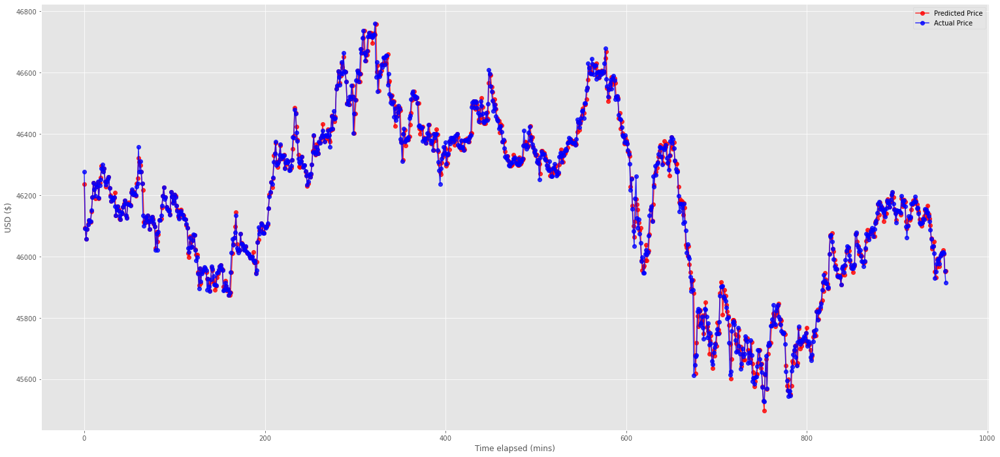

There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for

There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..
There is no data for the last minute. Skipping..


KeyboardInterrupt: 

In [33]:
while(True):
    time.sleep(60) # Wait for 60 seconds to make the prediction one minute later at each iteration
    
    stream = open(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\streamdata_final.txt',"r+") # This connects us to the file created at the Twitter Stream Notebook
    past_minute_data = stream.read().split(",") # From which we extract the values that were mined from Twitter
    stream.seek(0) # We set the pointer of the file to the beginning
    stream.truncate() # We delete the contents of the file and we get ready for the next batch of numbers

    past_minute_data = list(map(float,past_minute_data[:-1]))
    if( len(past_minute_data) == 0 ):
        print("There is no data for the last minute. Skipping..")
        continue
        
    last_minute_score = sum(past_minute_data)
    
    columns = ['Timestamp', 'Sentiment Score', 'Label', 'Previous Close Price', 'Moving Average of Close Price']
    
    time_stamp = time.strftime("%Y-%m-%d %H:%M:00", time.gmtime())
    last_entry = df_copy[['Timestamp', 'Label','Sentiment Score']].iloc[-1]
    previous_close = last_entry['Label']
    latest_time = last_entry['Timestamp']
    latest_time = pd.to_datetime(latest_time)

    window = latest_time - timedelta(hours=1) # The window is 60 minutes and it is set 1 hour before the last entry

    avg_rec_list = [] # This list contains the Previous Closing Prices that belong in this window
    for i in range(len(df_copy)):
        if (pd.to_datetime(df_copy['Timestamp'].iloc[i]) > window) and (pd.to_datetime(df_copy['Timestamp'].iloc[i]) <= latest_time):
            avg_rec_list.insert(0,df_copy['Previous Close Price'].iloc[i])
            
    avg_rec_list.append(previous_close)

    moving_avg_price = np.mean(avg_rec_list) # We take the moving average of the previous close price and use it as one of our inputs in the prediction function

    predicted_price = predict_price(last_minute_score, previous_close, moving_avg_price)
    clear_output(wait=True) # Clear the previous printed messages and plot in order to update it
    print("The predicted BTC price for the next minute is $"+repr(predicted_price))

    # The code below get the current Bitcoin price using the Cryptocompare API 
    contents = urllib.request.urlopen(  
            "%s?fsym=%s&tsyms=%s"%(CRYPTOAPI_URL,'BTC','USD')
        ).read()
    json_string = contents.decode("utf-8")
    current_price = json.loads(json_string)['BTC']['USD']

    print("The current BTC price is " + repr(current_price))

    print("We retrain the model for better results..\n")
    
    retrain_model(last_minute_score, previous_close, moving_avg_price,current_price) # The current price is added to the model to retrain it
    
    new_row = {'Timestamp': time_stamp, 'Sentiment Score': last_minute_score, 'Label': current_price, 'Previous Close Price': previous_close,'Moving Average of Close Price': moving_avg_price }
    
    df_copy.append(new_row, ignore_index = True)
    
    plotting_db = open(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\plotting_db_non_botted_final.txt',"a+")
    plotting_db.write(repr(predicted_price)+","+repr(current_price)+"\n")
    plotting_db.close()
    
    plot_data = np.genfromtxt(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\plotting_db_non_botted_final.txt',delimiter= ",")
    
    plt.style.use('ggplot')
    plt.ion()
    fig = plt.figure(figsize=(26,12))
    ax = fig.add_subplot(111)

    # create a variable for the line so we can later update it
    line1, = ax.plot(plot_data[:,0],'-o', color="red", alpha=0.8,label ='Predicted Price')
    line2, = ax.plot(plot_data[:,1],'-o',color="blue", alpha=0.8,label ='Actual Price')
    ax.legend()
    #update plot label/title
    plt.ylabel('USD ($)')
    plt.xlabel('Time elapsed (mins)')
    
    plt.show()

## Feature Importance and Errors

We use feature importance to get a general idea about which features the model is relying on most to make the prediction. This is a metric that simply sums up how many times each feature is split on. We can see that the most important feature is the last minute score and the least important one is the moving average of the price

In [34]:
xgb.plot_importance(model, height=0.9)

NameError: name 'model' is not defined

**Forecast Error = Real Value - Predicted Value** 

In [35]:
forecast_error = []
with open(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\plotting_db_non_botted_final.txt') as file:
    for line in file:
        forecast_error.append(float(line.split(",")[1]) - float(line.split(",")[0]))
print('The Forecast Error is',forecast_error)

The Forecast Error is [39.58999999999651, -1.3498437500020373, -0.010156249998544808, -0.017031249997671694, -1.1898437499985448, 0.4601562500029104, 1.2282812499979627, 0.6081249999988358, 4.33203125, -0.577812499999709, 0.3414062500014552, -0.5007812499970896, 8.1171875, 0.011406249999708962, -0.012656250000873115, 0.9607812500034925, 1.6865624999991269, -7.9296875, -4.777031249999709, -9.109531249996508, 12.03203124999709, -0.8321874999965075, 0.26140624999970896, -0.013124999997671694, 5.86015624999709, -2.007499999999709, -2.406562500000291, 1.4714062499988358, 1.229843749999418, -2.3615625000020373, 0.09859375000087311, 0.010937500002910383, -0.013437499997962732, 1.2006249999976717, -45.1870312500032, -0.010312500002328306, -0.930000000000291, -1.296875, -4.090156250000291, 7.348124999996799, -0.4015625000029104, 0.011406249999708962, 0.9281249999985448, -0.029999999998835847, -3.247656250001455, 0.7220312499994179, -0.590156250000291, -2.1518750000032014, 0.01171875, -6.8095312

In [36]:
mean_forecast_error = np.mean(forecast_error)
print('The Mean Forecast Error is',mean_forecast_error)

The Mean Forecast Error is -0.2856119109947583


In [37]:
abs_list = [abs(element) for element in forecast_error]
abs_list

[39.58999999999651,
 1.3498437500020373,
 0.010156249998544808,
 0.017031249997671694,
 1.1898437499985448,
 0.4601562500029104,
 1.2282812499979627,
 0.6081249999988358,
 4.33203125,
 0.577812499999709,
 0.3414062500014552,
 0.5007812499970896,
 8.1171875,
 0.011406249999708962,
 0.012656250000873115,
 0.9607812500034925,
 1.6865624999991269,
 7.9296875,
 4.777031249999709,
 9.109531249996508,
 12.03203124999709,
 0.8321874999965075,
 0.26140624999970896,
 0.013124999997671694,
 5.86015624999709,
 2.007499999999709,
 2.406562500000291,
 1.4714062499988358,
 1.229843749999418,
 2.3615625000020373,
 0.09859375000087311,
 0.010937500002910383,
 0.013437499997962732,
 1.2006249999976717,
 45.1870312500032,
 0.010312500002328306,
 0.930000000000291,
 1.296875,
 4.090156250000291,
 7.348124999996799,
 0.4015625000029104,
 0.011406249999708962,
 0.9281249999985448,
 0.029999999998835847,
 3.247656250001455,
 0.7220312499994179,
 0.590156250000291,
 2.1518750000032014,
 0.01171875,
 6.8095312

**Mean Absolute Error = abs(Real Value - Predicted Value)**

In [38]:
mean_absolute_error = np.mean(abs_list)
print('The Mean Absolute Error is',mean_absolute_error)

The Mean Absolute Error is 14.520866819371742


**Mean Absolute Percentage Error =  100*(Real Value - Predicted Value)/ Real Value**

In [41]:
predicted = []
with open(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\plotting_db_non_botted_final.txt') as file:
    for line in file:
        predicted.append(float(line.split(",")[0]))
predicted

[46236.0,
 46093.33984375,
 46056.91015625,
 46088.95703125,
 46105.08984375,
 46117.58984375,
 46112.26171875,
 46112.921875,
 46145.41796875,
 46193.0078125,
 46240.80859375,
 46218.30078125,
 46189.1328125,
 46233.05859375,
 46227.72265625,
 46242.69921875,
 46188.5234375,
 46239.9296875,
 46256.20703125,
 46296.51953125,
 46287.91796875,
 46277.4921875,
 46286.30859375,
 46244.953125,
 46227.83984375,
 46246.4375,
 46255.4765625,
 46258.80859375,
 46222.91015625,
 46198.8515625,
 46180.19140625,
 46190.2890625,
 46185.5234375,
 46192.109375,
 46207.70703125,
 46133.0703125,
 46153.0,
 46164.546875,
 46153.66015625,
 46123.171875,
 46121.3515625,
 46145.05859375,
 46139.171875,
 46161.0,
 46172.84765625,
 46181.91796875,
 46133.66015625,
 46126.921875,
 46172.48828125,
 46175.76953125,
 46170.16015625,
 46167.58984375,
 46209.7578125,
 46214.16796875,
 46202.16015625,
 46209.69921875,
 46205.2109375,
 46198.0,
 46238.58984375,
 46254.02734375,
 46320.796875,
 46308.3125,
 46296.7890

In [42]:
real = []
with open(r'C:\Users\Fivos\Desktop\Πτυχιακή\Prediction\plotting_db_non_botted_final.txt') as file:
    for line in file:
        real.append(float(line.split(",")[1]))
real

[46275.59,
 46091.99,
 46056.9,
 46088.94,
 46103.9,
 46118.05,
 46113.49,
 46113.53,
 46149.75,
 46192.43,
 46241.15,
 46217.8,
 46197.25,
 46233.07,
 46227.71,
 46243.66,
 46190.21,
 46232.0,
 46251.43,
 46287.41,
 46299.95,
 46276.66,
 46286.57,
 46244.94,
 46233.7,
 46244.43,
 46253.07,
 46260.28,
 46224.14,
 46196.49,
 46180.29,
 46190.3,
 46185.51,
 46193.31,
 46162.52,
 46133.06,
 46152.07,
 46163.25,
 46149.57,
 46130.52,
 46120.95,
 46145.07,
 46140.1,
 46160.97,
 46169.6,
 46182.64,
 46133.07,
 46124.77,
 46172.5,
 46168.96,
 46170.15,
 46164.94,
 46207.46,
 46218.11,
 46202.62,
 46208.55,
 46204.21,
 46199.07,
 46227.77,
 46238.01,
 46356.38,
 46275.5,
 46309.92,
 46275.59,
 46238.5,
 46133.52,
 46099.37,
 46110.18,
 46127.71,
 46120.21,
 46133.29,
 46113.93,
 46089.92,
 46115.36,
 46124.51,
 46129.76,
 46119.16,
 46107.5,
 46098.37,
 46020.5,
 46073.6,
 46021.93,
 46080.06,
 46119.85,
 46118.45,
 46133.06,
 46166.38,
 46197.22,
 46224.77,
 46187.3,
 46193.62,
 46161.95,
 46

In [43]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [44]:
mape = mean_absolute_percentage_error(real,predicted)
print('The Mean Absolute Percentage Error is',mape,'%')

The Mean Absolute Percentage Error is 0.031446207523054784 %


**Mean Squared Error = sqrt( (Real Value - Predicted Value)^2 )**

In [45]:
mse = mean_squared_error(real, predicted)
rmse = sqrt(mse)
print('The Root Mean Squared Error is: %f' % rmse)

The Root Mean Squared Error is: 24.661545


In [46]:
rmse_list = []
for i in range(len(predicted)):
    rmse_list.append(sqrt((real[i] - predicted[i])**2))

In [47]:
rmse_list

[39.58999999999651,
 1.3498437500020373,
 0.010156249998544808,
 0.017031249997671694,
 1.1898437499985448,
 0.4601562500029104,
 1.2282812499979627,
 0.6081249999988358,
 4.33203125,
 0.577812499999709,
 0.3414062500014552,
 0.5007812499970896,
 8.1171875,
 0.011406249999708962,
 0.012656250000873115,
 0.9607812500034925,
 1.6865624999991269,
 7.9296875,
 4.777031249999709,
 9.109531249996508,
 12.03203124999709,
 0.8321874999965075,
 0.26140624999970896,
 0.013124999997671694,
 5.86015624999709,
 2.007499999999709,
 2.406562500000291,
 1.4714062499988358,
 1.229843749999418,
 2.3615625000020373,
 0.09859375000087311,
 0.010937500002910383,
 0.013437499997962732,
 1.2006249999976717,
 45.1870312500032,
 0.010312500002328306,
 0.930000000000291,
 1.296875,
 4.090156250000291,
 7.348124999996799,
 0.4015625000029104,
 0.011406249999708962,
 0.9281249999985448,
 0.029999999998835847,
 3.247656250001455,
 0.7220312499994179,
 0.590156250000291,
 2.1518750000032014,
 0.01171875,
 6.8095312

In [48]:
minutes = []
for i in range(0,len(rmse_list)):
    minutes.append(i)
minutes

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


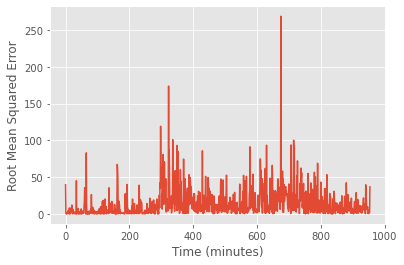

In [49]:
plt.plot(minutes,rmse_list)
plt.xlabel('Time (minutes)')
plt.ylabel('Root Mean Squared Error')
#plt.ylim(0,600)
plt.show()